####import packages

In [ ]:
#! pip install opencv-python

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

Mounted at /content/drive


In [74]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
import matplotlib.patches as patches
import sklearn

#### preparation du dataframe

In [44]:
#transformation du dataframe pour faire apparaitre 3 colonnes image formation et encodedpixels

In [75]:
train = pd.read_csv('train.csv')
train.head()

,Image_Label,EncodedPixels
0,0011165.jpg_Fish,264918 937 266318 937 267718 937 269118 937 27...
1,0011165.jpg_Flower,1355565 1002 1356965 1002 1358365 1002 1359765...
2,0011165.jpg_Gravel,NaN
3,0011165.jpg_Sugar,NaN
4,002be4f.jpg_Fish,233813 878 235213 878 236613 878 238010 881 23...


In [76]:
#chemin des images
path="train_images//"

In [77]:
#separation de la colonne Image_label en 2 : Image et Formation
train['Image'] = train['Image_Label'].apply(lambda name: name.split('_')[0])
train['Formation'] = train['Image_Label'].apply(lambda name: name.split('_')[1])

#suppression colonne Image_label et na
train = train.drop('Image_Label', axis = 1)

In [78]:
train.head()

,EncodedPixels,Image,Formation
0,264918 937 266318 937 267718 937 269118 937 27...,0011165.jpg,Fish
1,1355565 1002 1356965 1002 1358365 1002 1359765...,0011165.jpg,Flower
2,NaN,0011165.jpg,Gravel
3,NaN,0011165.jpg,Sugar
4,233813 878 235213 878 236613 878 238010 881 23...,002be4f.jpg,Fish


In [79]:
train = train.dropna() #suppression des NaN 

train= train[['Image', 'Formation', 'EncodedPixels']]

In [80]:
train.head()

,Image,Formation,EncodedPixels
0,0011165.jpg,Fish,264918 937 266318 937 267718 937 269118 937 27...
1,0011165.jpg,Flower,1355565 1002 1356965 1002 1358365 1002 1359765...
4,002be4f.jpg,Fish,233813 878 235213 878 236613 878 238010 881 23...
5,002be4f.jpg,Flower,1339279 519 1340679 519 1342079 519 1343479 51...
7,002be4f.jpg,Sugar,67495 350 68895 350 70295 350 71695 350 73095 ...


In [81]:
train = train.reset_index() #reset des index


In [82]:
train.head()

,index,Image,Formation,EncodedPixels
0,0,0011165.jpg,Fish,264918 937 266318 937 267718 937 269118 937 27...
1,1,0011165.jpg,Flower,1355565 1002 1356965 1002 1358365 1002 1359765...
2,4,002be4f.jpg,Fish,233813 878 235213 878 236613 878 238010 881 23...
3,5,002be4f.jpg,Flower,1339279 519 1340679 519 1342079 519 1343479 51...
4,7,002be4f.jpg,Sugar,67495 350 68895 350 70295 350 71695 350 73095 ...


In [83]:
train = train.drop('index', axis = 1) #suppression de la colonne index

In [84]:
train.head()

,Image,Formation,EncodedPixels
0,0011165.jpg,Fish,264918 937 266318 937 267718 937 269118 937 27...
1,0011165.jpg,Flower,1355565 1002 1356965 1002 1358365 1002 1359765...
2,002be4f.jpg,Fish,233813 878 235213 878 236613 878 238010 881 23...
3,002be4f.jpg,Flower,1339279 519 1340679 519 1342079 519 1343479 51...
4,002be4f.jpg,Sugar,67495 350 68895 350 70295 350 71695 350 73095 ...


In [85]:
train.shape

(11836, 3)

#### definition de la fonction qui convertit le code RLE en masque

In [86]:
#fonction qui permet de faire un masque avec un rle (present dans colonne "encodedpixels")

#la colonne EncodedPixels contient les masques d'encodage rle pour chaque Image et chaque formation

#le codage rle se compose d'une séquence de nombres groupés 2 par 2
#chaque premier nombre correspond au numero du 1er pixel et le second au nombre de pixels consecutifs apres le 1er pixel composant le masque 

In [87]:
def rleToMask(rleString,height,width):    
    '''
    Cette fonction est un convertisseur rle vers masque.
    On fournit une séquence rle pour un masque, ainsi que la hauteur et la largeur de l image
    et la fonction retourne le masque.
    '''
    rows,cols = height,width
    rleNumbers = [int(numstring) for numstring in rleString.split(' ')]#decoupage sequence sur les espaces
    rlePairs = np.array(rleNumbers).reshape(-1,2)#groupement par 2
    img = np.zeros(rows*cols,dtype=np.uint8) #on met tous les pixels en noir
    for index,length in rlePairs:
        index -= 1
        img[index:index+length] = 255 #pour chaque couple index,length, on remplit le masque en blanc
    img = img.reshape(cols,rows) #on reshape le masque au format de l image
    img = img.T
    return img


#### affichage de quelques images

Dans un premier temps, on observe juste quelques images du dataset avec les formations encadrées par des bounding boxes.

In [88]:
### définition d'une fonction qui renvoie les min et max des indices d'une bounding box

def bounding_box(img):
    ''' cette fonction retourne les min et max d'un masque pour dessiner une bounding box'''
    rows = np.any(img, axis=1) #renvoie True pour toutes les lignes avec au moins un 255
    cols = np.any(img, axis=0) #renvoie True pour toutes les colonnes avec au moins un 255
    rmin, rmax = np.where(rows)[0][[0, -1]] #renvoie le premier et le dernier indice des lignes avec rows=True 
    cmin, cmax = np.where(cols)[0][[0, -1]] #renvoie le premier et le dernier indice des colonnes avec cols=True 

    return rmin, rmax, cmin, cmax


In [89]:
### On veut maintenant afficher les images de nuages avec les formations entourées (bounding box)


def plot_cloud_formations(id_image):
  '''
    Cette fonction montre une image à partir de son nom ("xxx.jpg") 
    et superpose les masques sous forme de bounding box dans differentes couleurs
    en fonction de la formation
    '''
    
  img_color = cv2.imread(path + id_image, cv2.IMREAD_COLOR) #lecture image
  img_color = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)
  shape = img_color.shape #dimensions de l image
    

#afficher l'image
    
  fig = plt.figure(figsize=(10,10))
  ax = fig.add_subplot(111)
  ax.imshow(img_color)

# creation et affichage des bouding box correspondant à l image id_image

  masks = train[train['Image'] == id_image]['EncodedPixels'] #recuperer les codes RLE correspondant a l image id_image 
  formations = train[train['Image'] == id_image]['Formation'] #recuperer les formations correspondantes
    
    
  for maskrle, formation in zip(masks,formations):
      mask = rleToMask(maskrle, shape[0], shape[1]) #conversion des codes RLE en mask
       
      ymin, ymax, xmin, xmax = bounding_box(mask) #pour obtenir les limites de la bounding box encadrant le mask
      color_dict = {'Fish' : 'b' , 'Flower' : 'r', 'Gravel': 'yellow' , 'Sugar' : 'white'} #dictionnaire des couleurs selon le type de formation
      rect = patches.Rectangle([xmin, ymin], xmax-xmin, ymax-ymin, linewidth=4, 
                                 facecolor='none', edgecolor = color_dict[formation],
                                 label = formation) #definition des rectangles qui encadrent les formations, aux bonnes dimensions et avec la bonne couleur 
      ax.add_patch(rect) # tracer la bounding box
        
        
  plt.xticks([])
  plt.yticks([])
  plt.title(id_image) #affichage du nom de l image
  plt.legend()    
  plt.show()
    

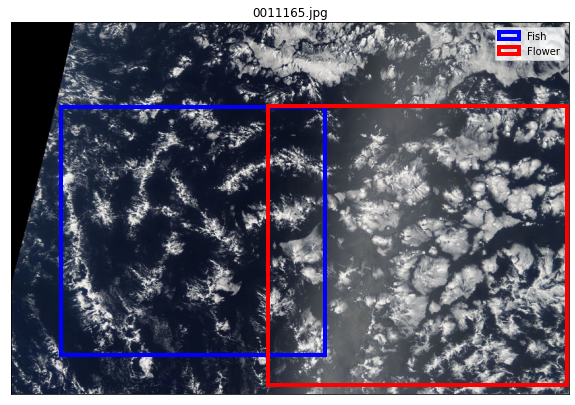

In [90]:
plot_cloud_formations("0011165.jpg")

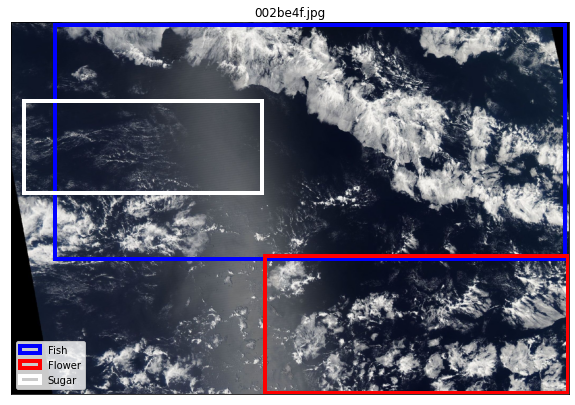

In [91]:
plot_cloud_formations("002be4f.jpg")

Sur les 2 images précédentes, on observe des fenetres qui se recoupent ou qui sont incluses... ça semble lié au fait que la selection se fait par des rectangles. Par exemple dans l'image 002be4f.jpg, la formation fish en bleu est en diagonale et la formation sugar se trouve dans le coin innocupé... 
La sélection des formations de nuages par des bounding boxes nous amènent du biais. Le fait de faire de la segmentation (step final du projet) nous permettra de supprimer ce biais.

On va essayer de voir si on est capable de décrire qualitativement ce qui caractérise chacune des formations

In [92]:
#on va constituer des listes pour chaque type de formation, de 4 indices pris au hasard dans train

#intialisation des listes
indice_fish=[]
indice_gravel=[]
indice_flower=[]
indice_sugar=[]

#tirage aleatoire d'indices correspondant à chaque type de formation
for i in range(4):
  train_fish_index=train[train["Formation"]=="Fish"].index
  indice_fi = np.random.choice(list(train_fish_index))
  train_gravel_index=train[train["Formation"]=="Gravel"].index
  indice_gra = np.random.choice(list(train_gravel_index))
  train_flower_index=train[train["Formation"]=="Flower"].index
  indice_flo = np.random.choice(list(train_flower_index))
  train_sugar_index=train[train["Formation"]=="Sugar"].index
  indice_sug = np.random.choice(list(train_sugar_index))
  indice_fish.append(indice_fi)
  indice_gravel.append(indice_gra)
  indice_flower.append(indice_flo)
  indice_sugar.append(indice_sug)


In [93]:
indice_gravel

[7773, 4052, 11813, 1871]

In [94]:
#afficher 4 formations de chaque type

In [95]:
### ici on affiche 4 formations de chaque famille de formation pour comparer

def plot_families(indice_list):
    '''Cette fonction affiche 4 formations de nuages correspondant à une liste d'index de ligne.
    '''
    
    fig = plt.figure(figsize=(50,100)) 
    k=0

    for i in indice_list:
 
      #extraction du nom de formation, du nom de l image et du rle correspondant à i
      formation=train['Formation'][i]
      image_id=train["Image"][i]
      mask_id=train['EncodedPixels'][i]

      #lecture de l image correspondant à i       
      img_color = cv2.imread(path + image_id, cv2.IMREAD_COLOR)
      img_color = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)

      shape = img_color.shape 
      mask = rleToMask(mask_id, shape[0], shape[1]) #transformation rle en mask
      ymin, ymax, xmin, xmax= bounding_box(mask) #definition des limites de la bounding box

      #on ne va garder que la partie de l'image correspondant à la bounding box
      img_zoom = img_color[ymin:ymax,xmin:xmax, :] 
      img_zoom = cv2.resize(img_zoom, (xmax-xmin,ymax-ymin))

      #on trace la figure correspondant à i
      k+=1
    
      plt.subplot(1,4,k)   
      plt.imshow(img_zoom)
      plt.xticks([])
      plt.yticks([])
      plt.title(formation + ' ' + train['Image'][i])




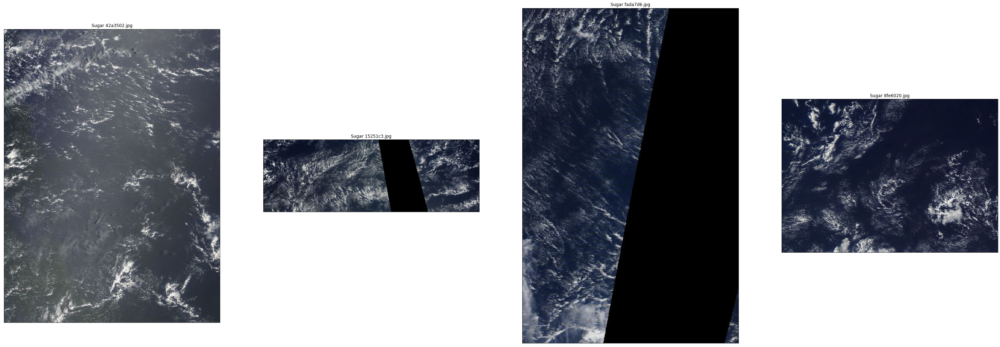

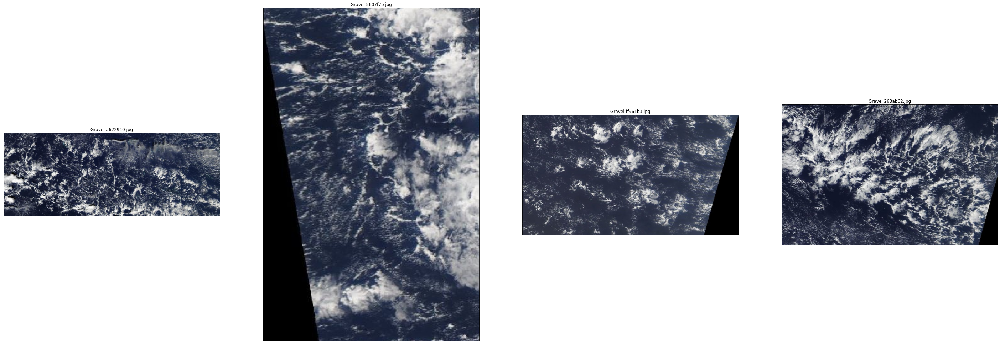

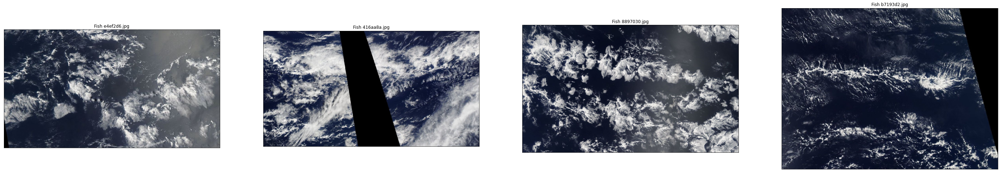

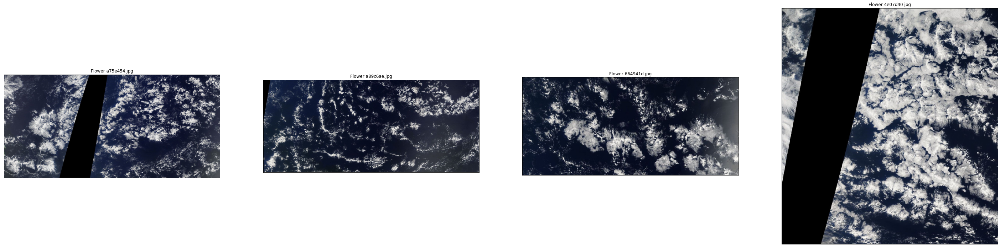

In [96]:
#affichage de 4 formations sugar + 4 gravel + 4 fish + 4 flower 
plot_families(indice_sugar)
plot_families(indice_gravel)
plot_families(indice_fish)
plot_families(indice_flower)

Pour les formations Sugar on voit souvent des sortes de petits "grains" répartis sur l'image : 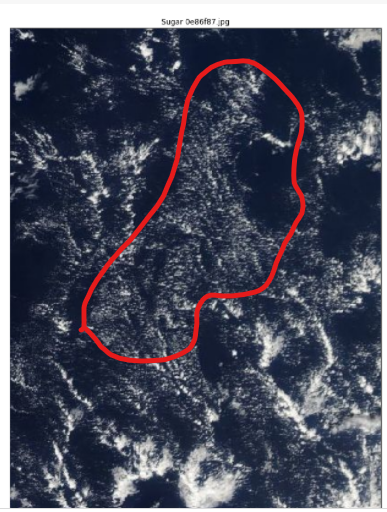 

Pour les formations Fish on voit souvent des formations assez denses et en longueur :

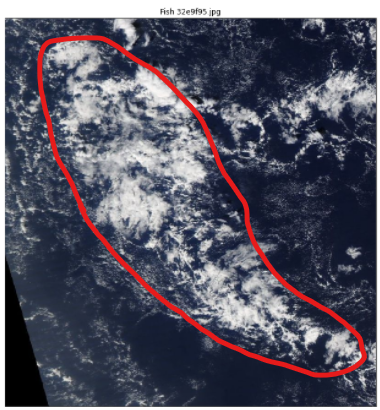

Pour les formations Flower on voit souvent des taches un peu larges, bien denses, réparties, qui peuvent faire penser aux pétales d'une fleur :
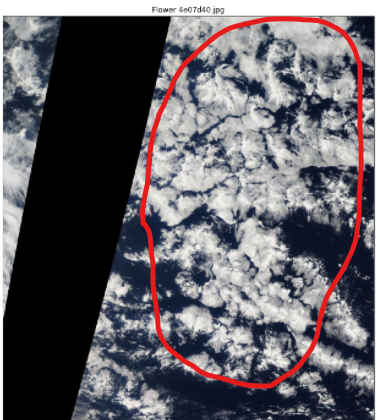

Pour les formations Gravel on voit souvent des formations peu denses (peut etre un peu plus que sugar) et structurées :

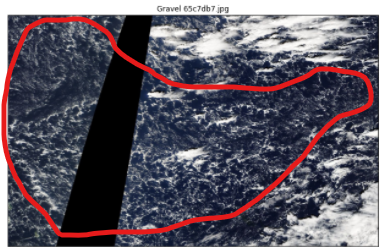

Au final on a l'impression de distinguer quelques caractéristiques (densité, élongation...) permettant d'aider à reconnaitre les formations, mais pour des néophytes comme nous, il est très difficile dans la plupart du temps de faire la différence entre les formations.

#### Etape 1 : En se basant uniquement sur les formations délimitées par les bounding box, recherche de features qui pourraient etre intéressants

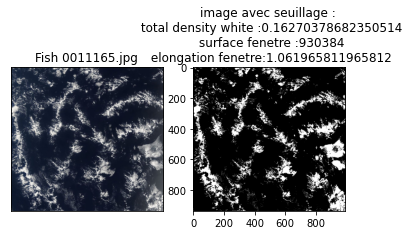

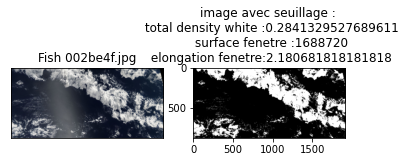

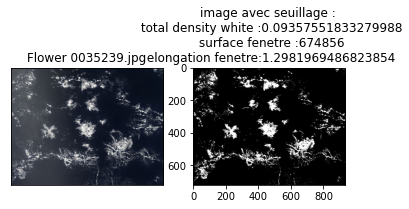

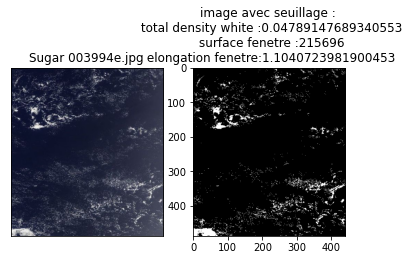

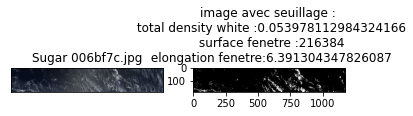

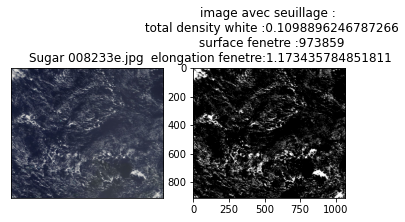

In [67]:
### ici on va chercher à definir des features sur les images et à les afficher
## pour voir les différences sur les images directement
### STEP 1

#on se propose de créer une fonction qui va afficher les formations correspondant 
# à un index de ligne du dataframe et qui va renvoyer directement sur l'image
# les valeurs de quelques features :
# - l'elongation -> correspond au rapport entre la longueur et la largeur de la bounding box
# - le surface_bb -> correspond à la surface de la bounding box
# - total_density_white -> densité de blanc dans l image

def plot_index(line_index):
    '''Cette fonction affiche les formations de nuages correspondant à l'index de ligne.
    elle fait le ratio entre les 2 dimensions de la selection
    elle applique un filtre threshold pour avoir seulement des pixels blanc et noirs
    et elle fait le calcul de la densité totale de pixels blancs.
    Enfin elle affiche la formation filtrée avec la valeur des features calculées'''
    
    #extraction du nom de formation, du nom de l image et du rle correspondant à line_index
    formation=train['Formation'][line_index]
    image_id=train["Image"][line_index]
    mask_id=train['EncodedPixels'][line_index]

    #lecture de l image correspondant à line_index       
    img_color = cv2.imread(path + image_id, cv2.IMREAD_COLOR)
    img_color = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)

    
    shape = img_color.shape 
    
    mask = rleToMask(mask_id, shape[0], shape[1]) #transformation rle en mask
    ymin, ymax, xmin, xmax= bounding_box(mask) #definition des limites de la bounding box

    #on ne va garder que la partie de l'image correspondant à la bounding box
    img_zoom = img_color[ymin:ymax,xmin:xmax, :] 
    img_zoom = cv2.resize(img_zoom, (xmax-xmin,ymax-ymin))

    #on trace la figure correspondant à line_index
    fig = plt.figure() 
    plt.subplot(121)   
    plt.imshow(img_zoom)
    plt.xticks([])
    plt.yticks([])
    plt.title(formation + ' ' + train['Image'][line_index])


    #on calcule l elongation de la bounding box (ratio longueur/largeur)
    #on calcule la surface de la bounding box
    ratio_bounding_box=min((ymax-ymin),(xmax-xmin))/max((ymax-ymin),(xmax-xmin))
    surface_bb=(ymax-ymin)*(xmax-xmin)
    elongation=1/ratio_bounding_box


    #pour calculer la densité de pixels blancs, on va commencer par convertir en niveaux de gris 
    #et par un seuillage de l image (pour n avoir que du noir et blanc)

    img_gray = cv2.cvtColor(img_zoom, cv2.COLOR_BGR2GRAY)
    seuil,img_seuillage=cv2.threshold(img_gray,115,255,type=cv2.THRESH_BINARY)
    plt.subplot(122)    
    plt.imshow(img_seuillage,cmap='gray') #affichage image seuillée
    

    # donner proportion de blanc vs noir
    number_of_white_pix = np.sum(img_seuillage == 255) 
    number_of_black_pix = np.sum(img_seuillage == 0)
    total_density_white=number_of_white_pix/surface_bb


    #on affiche à la place du titre les valeurs des features calculés
    plt.title('image avec seuillage : \n total density white :'+ str(total_density_white) + '\n surface fenetre :'+ str(surface_bb) 
              +'\n elongation fenetre:'+str(elongation))

    ##########################################


#on trace quelques images en affichant les valeurs des features    
plot_index(0)   
plot_index(2)  
plot_index(8)  
plot_index(12)  
plot_index(15)  
plot_index(18)  


Comme on l'a déjà évoqué, on observe que parfois les formations n'occupent qu une partie de l'espace et donc notre critere de densité de pixels blanc peut etre biaisé -> nous proposons de diviser l'image en plusieurs pour pouvoir mesurer des densités localisées

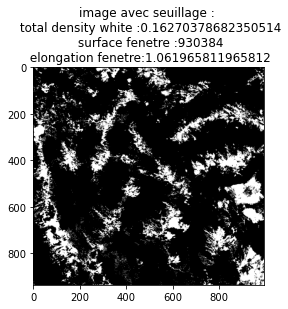

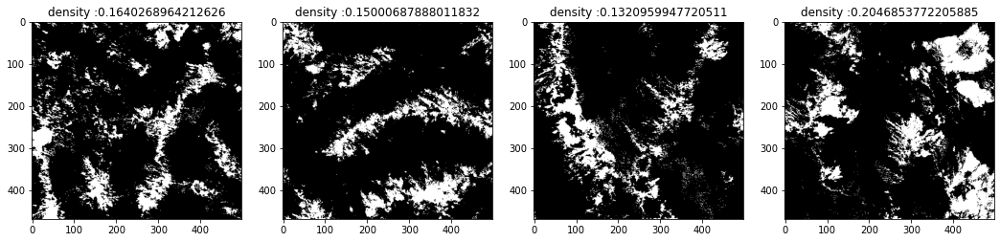

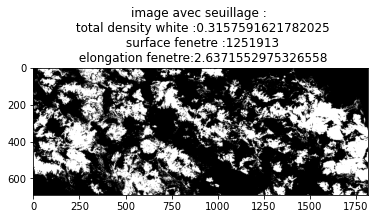

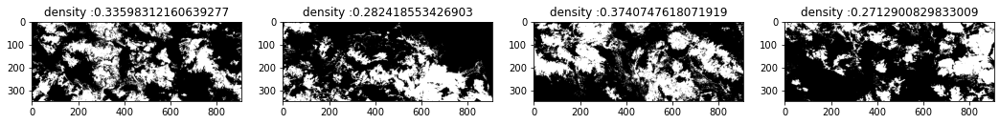

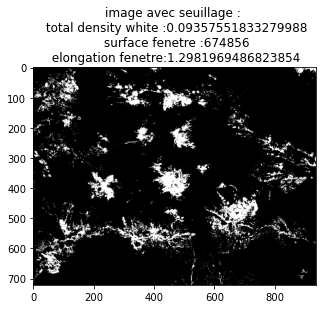

...

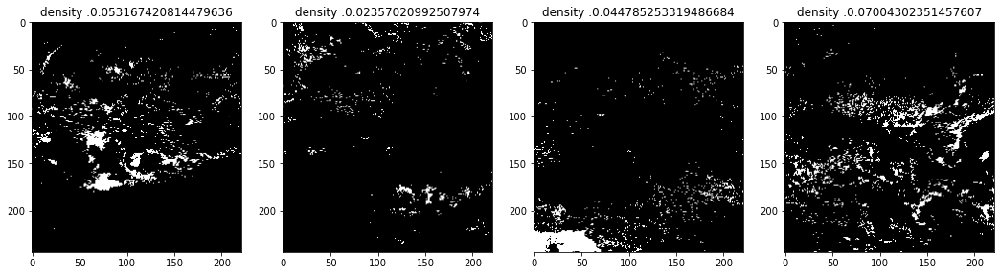

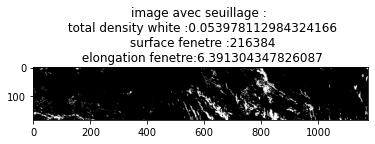

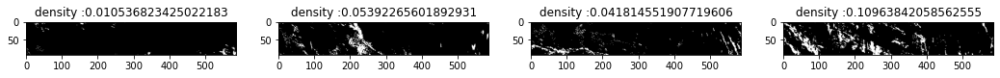

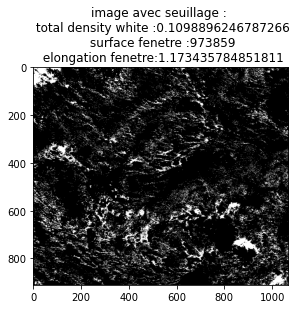

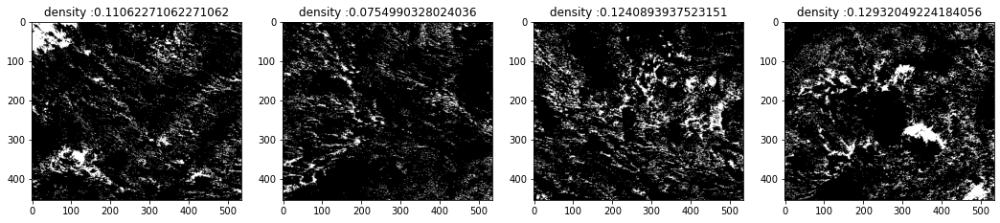

In [68]:
### on va rajouter à la fonction précédente un critere de densités localisées
#il s'agit de découper l'image en sous-images (on divise selon la hauteur et la largeur)
# puis de calculer les densités de pixels blancs sur chacune des zones
#on affiche ensuite l'image seuillée et les sous images avec leurs valeurs de 
#densité localisée


def plot_index_final(line_index):
    '''Cette fonction prend la formation de nuages correspondant à line_index.
    elle fait le ratio entre les 2 dimensions de la selection
    elle applique un filtre threshold pour avoir seulement des pixels blanc et noirs
    et elle fait le calcul de la densité totale de pixels blancs.
    elle affiche la formation filtrée avec la valeur des features calculées
    apres cela elle fait les calculs de densités locales
    (par exemple si la selection est divisée en 4, on affichera les 4 sous images)'''
    
    #extraction du nom de formation, du nom de l image et du rle correspondant à line_index
    formation=train['Formation'][line_index]
    image_id=train["Image"][line_index]
    mask_id=train['EncodedPixels'][line_index]
           
    #lecture de l image correspondant à line_index 
    img_color = cv2.imread(path + image_id, cv2.IMREAD_COLOR)
    img_color = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)

    
    shape = img_color.shape 
    mask = rleToMask(mask_id, shape[0], shape[1]) #transformation rle en mask
    ymin, ymax, xmin, xmax= bounding_box(mask) #definition des limites de la bounding box

    #on ne va garder que la partie de l'image correspondant à la bounding box
    img_zoom = img_color[ymin:ymax,xmin:xmax, :] 
    img_zoom = cv2.resize(img_zoom, (xmax-xmin,ymax-ymin))


    #on calcule l elongation de la bounding box (ratio longueur/largeur)
    #on calcule la surface de la bounding box
    ratio_bounding_box=min((ymax-ymin),(xmax-xmin))/max((ymax-ymin),(xmax-xmin))
    surface_bb=(ymax-ymin)*(xmax-xmin)
    elongation=1/ratio_bounding_box


    
    #pour calculer la densité de pixels blancs, on va commencer par convertir en niveaux de gris 
    #et par un seuillage de l image (pour n avoir que du noir et blanc)
    img_gray = cv2.cvtColor(img_zoom, cv2.COLOR_BGR2GRAY)
    seuil,img_seuillage=cv2.threshold(img_gray,115,255,type=cv2.THRESH_BINARY)
    fig = plt.figure()    
    plt.imshow(img_seuillage,cmap='gray') #affichage image seuillée
    

    # donner proportion de blanc vs noir
    number_of_white_pix = np.sum(img_seuillage == 255) 
    number_of_black_pix = np.sum(img_seuillage == 0)
    total_density_white=number_of_white_pix/surface_bb


    #on affiche à la place du titre les valeurs des features calculés
    plt.title('image avec seuillage : \n total density white :'+ str(total_density_white) + '\n surface fenetre :'+ str(surface_bb) 
              +'\n elongation fenetre:'+str(elongation))

    ##########################################

    #calcul de densité localisée
    #on divise image seuillée en xcut en abscisse et ycut en ordonnée
    #sur chaque zone, on va calculer la densité de pixels blancs

    xcut=2  #nombre de tranches en abscisse (à ajuster)
    ycut=2  #nombre de tranches en ordonnee (à ajuster)

    ysizecut=int((ymax-ymin)/ycut) #largeur de la sous image
    xsizecut=int((xmax-xmin)/xcut) #hauteur de la sous image
    tot_pix_cut=xsizecut*ysizecut
    density_white=[]

    #liste contenant les limites x et y des sous images seuillees 
    img_cut=[img_seuillage[y*ysizecut:(y+1)*ysizecut,x*xsizecut:(x+1)*xsizecut] for y in range(ycut) for x in range(xcut) ]
    

    plt.figure(figsize=(18,5))

    for i in range(xcut*ycut):
      img_cut[i]=cv2.resize(img_cut[i], (xsizecut,ysizecut))
      #print(np.shape(img_cut[i]))
      plt.subplot(1,xcut*ycut,i+1)
      plt.imshow(img_cut[i],cmap='gray') #affichage des sous images

      #calcul densité de blanc sur chaque sous image
      density=np.sum(img_cut[i] == 255)/tot_pix_cut
      density_white.append(density)

      plt.title("density :" + str(density)) #affichage sur la figure

    
plot_index_final(0)   
plot_index_final(5)  
plot_index_final(8)  
plot_index_final(12)  
plot_index_final(15)  
plot_index_final(18) ;  



####Etape 2 : extraction des features et création du dataframe

In [69]:
### on reprend les lignes de codes précédantes sans affichage pour
### construire le dataframe cette fois-ci
###la fonction va renvoyer les features à écrire dans le dataframe
### on met en parametre de la fonction le nombre de tranches dans les 2 axes pour 
### calcul de densités localisées

#STEP 2


def extract_features_index(line_index,xcut,ycut):
    '''Cette fonction extrait les features des formations de nuage correspondant à line_index.
    elle retourne tous les features
    line_index est l'index du dataframe
    xcut et ycut sont les nombres de tranches pour le calcul des densités locales 
    
    retourne ratio_bounding_box (ratio entre 2 dimensions de la bounding box),
    surface_bb (surface totale de la bounding box),
    total_density_white (nombre de pixels blancs de la selection filtrée / nombre total de pixels),
    density_white(densités locales)'''
    
    #extraction du nom de formation, du nom de l image et du rle correspondant à line_index
    formation=train['Formation'][line_index]
    image_id=train["Image"][line_index]
    mask_id=train['EncodedPixels'][line_index]
           
    #lecture de l image correspondant à line_index 
    img_color = cv2.imread(path + image_id, cv2.IMREAD_COLOR)
    img_color = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)

    shape = img_color.shape 
    mask = rleToMask(mask_id, shape[0], shape[1]) #transformation rle en mask
    ymin, ymax, xmin, xmax= bounding_box(mask) #definition des limites de la bounding box

    #on ne va garder que la partie de l'image correspondant à la bounding box
    img_zoom = img_color[ymin:ymax,xmin:xmax, :] 
    img_zoom = cv2.resize(img_zoom, (xmax-xmin,ymax-ymin))

    
    #on calcule le ratio bounding box 
    #on calcule la surface de la bounding box
    ratio_bounding_box=min((ymax-ymin),(xmax-xmin))/max((ymax-ymin),(xmax-xmin))
    surface_bb=(ymax-ymin)*(xmax-xmin)
    

    #pour calculer la densité de pixels blancs, on va commencer par convertir en niveaux de gris 
    #et par un seuillage de l image (pour n avoir que du noir et blanc)
    img_gray = cv2.cvtColor(img_zoom, cv2.COLOR_BGR2GRAY)
    seuil,img_seuillage=cv2.threshold(img_gray,115,255,type=cv2.THRESH_BINARY)
    

    # donner proportion de blanc vs noir
    number_of_white_pix = np.sum(img_seuillage == 255) 
    number_of_black_pix = np.sum(img_seuillage == 0)
    total_density_white=number_of_white_pix/surface_bb


    ##########################################

    #calcul de densité localisée
    #on divise image seuillée en xcut en abscisse et ycut en ordonnée
    #sur chaque zone, on va calculer la densité de pixels blancs

    ysizecut=int((ymax-ymin)/ycut) #largeur de la sous image
    xsizecut=int((xmax-xmin)/xcut) #hauteur de la sous image
    tot_pix_cut=xsizecut*ysizecut
    density_white=[]

    #liste contenant les limites x et y des sous images seuillees 
    img_cut=[img_seuillage[y*ysizecut:(y+1)*ysizecut,x*xsizecut:(x+1)*xsizecut] for y in range(ycut) for x in range(xcut) ]
    
    for i in range(xcut*ycut):
      img_cut[i]=cv2.resize(img_cut[i], (xsizecut,ysizecut))

      #calcul densité de blanc sur chaque sous image
      density=np.sum(img_cut[i] == 255)/tot_pix_cut
      density_white.append(density)

    return ratio_bounding_box,surface_bb,total_density_white,density_white
    
 

In [ ]:
#on va assembler le dataframe

In [70]:
df1=train 
df1.head()

,Image,Formation,EncodedPixels
0,0011165.jpg,Fish,264918 937 266318 937 267718 937 269118 937 27...
1,0011165.jpg,Flower,1355565 1002 1356965 1002 1358365 1002 1359765...
2,002be4f.jpg,Fish,233813 878 235213 878 236613 878 238010 881 23...
3,002be4f.jpg,Flower,1339279 519 1340679 519 1342079 519 1343479 51...
4,002be4f.jpg,Sugar,67495 350 68895 350 70295 350 71695 350 73095 ...


In [71]:
#extraction des features : 

In [72]:
df_ratio_bbox=[]
df_surface_bb=[]
df_total_density_white=[]
df_density_white=[]

#agglomeration des features pour chaque ligne de df1
for indice in range(df1.shape[0]):
  ratio_bounding_box,surface_bb,total_density_white,density_white=extract_features_index(indice,2,2)
  df_ratio_bbox.append(ratio_bounding_box)
  df_surface_bb.append(surface_bb)
  df_total_density_white.append(total_density_white)
  df_density_white.append(density_white)



In [73]:
# dataframe qui reprend les parametres globaux

In [ ]:
df2 = pd.DataFrame(list(zip(df_ratio_bbox,df_surface_bb,df_total_density_white)), columns = ['df_ratio_bbox','df_surface_bb','df_total_density_white'])

df2.head()

,df_ratio_bbox,df_surface_bb,df_total_density_white
0,0.941650,930384,0.162704
1,0.934281,1184552,0.368665
2,0.458572,1688720,0.284133
3,0.453988,591038,0.288861
4,0.389509,312704,0.015347


In [ ]:
#dataframe qui reprend parametres locaux

In [ ]:
name_col=[]
for i in range(np.shape(df_density_white)[1]):
  name_col.append("df_density_white_"+str(i))

df3=pd.DataFrame(df_density_white,columns=name_col)
df3.head()

,df_density_white_0,df_density_white_1,df_density_white_2,df_density_white_3
0,0.164027,0.150007,0.132096,0.204685
1,0.286360,0.419281,0.316038,0.452981
2,0.280524,0.401360,0.166265,0.288442
3,0.198368,0.273637,0.280390,0.402615
4,0.019820,0.005452,0.019397,0.016202


In [ ]:
#concatenation de tous les dataframes

In [ ]:
df=pd.concat([df1, df2,df3], axis=1)
df.head()

,Image,Formation,EncodedPixels,df_ratio_bbox,df_surface_bb,df_total_density_white,df_density_white_0,df_density_white_1,df_density_white_2,df_density_white_3
0,0011165.jpg,Fish,264918 937 266318 937 267718 937 269118 937 27...,0.941650,930384,0.162704,0.164027,0.150007,0.132096,0.204685
1,0011165.jpg,Flower,1355565 1002 1356965 1002 1358365 1002 1359765...,0.934281,1184552,0.368665,0.286360,0.419281,0.316038,0.452981
2,002be4f.jpg,Fish,233813 878 235213 878 236613 878 238010 881 23...,0.458572,1688720,0.284133,0.280524,0.401360,0.166265,0.288442
3,002be4f.jpg,Flower,1339279 519 1340679 519 1342079 519 1343479 51...,0.453988,591038,0.288861,0.198368,0.273637,0.280390,0.402615
4,002be4f.jpg,Sugar,67495 350 68895 350 70295 350 71695 350 73095 ...,0.389509,312704,0.015347,0.019820,0.005452,0.019397,0.016202


In [ ]:
#sauvegarde du dataframe en csv (pour éviter de refaire l'extract des features qui est long)

In [ ]:
df.to_csv('df.csv')

#### quelques observation des features

In [ ]:
# relecture du csv

In [ ]:

df = pd.read_csv('df.csv',index_col=0)


In [ ]:
data=df
data.head()

,Image,Formation,EncodedPixels,df_ratio_bbox,df_surface_bb,df_total_density_white,df_density_white_0,df_density_white_1,df_density_white_2,df_density_white_3
0,0011165.jpg,Fish,264918 937 266318 937 267718 937 269118 937 27...,0.941650,930384,0.162704,0.164027,0.150007,0.132096,0.204685
1,0011165.jpg,Flower,1355565 1002 1356965 1002 1358365 1002 1359765...,0.934281,1184552,0.368665,0.286360,0.419281,0.316038,0.452981
2,002be4f.jpg,Fish,233813 878 235213 878 236613 878 238010 881 23...,0.458572,1688720,0.284133,0.280524,0.401360,0.166265,0.288442
3,002be4f.jpg,Flower,1339279 519 1340679 519 1342079 519 1343479 51...,0.453988,591038,0.288861,0.198368,0.273637,0.280390,0.402615
4,002be4f.jpg,Sugar,67495 350 68895 350 70295 350 71695 350 73095 ...,0.389509,312704,0.015347,0.019820,0.005452,0.019397,0.016202


In [ ]:
#on regarde les distributions des features en fonction des labels

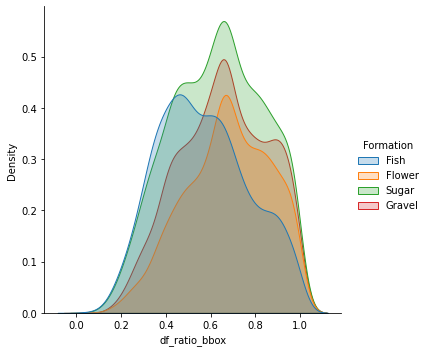

In [ ]:
import seaborn as sns

sns.displot(df, x="df_ratio_bbox", hue="Formation", kind="kde", fill=True);


on observe que les fish sont un peu plus allongés en général

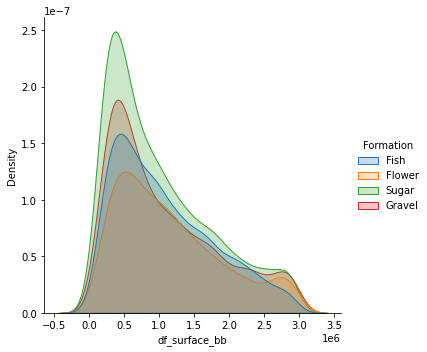

In [ ]:
sns.displot(df, x="df_surface_bb", hue="Formation", kind="kde", fill=True);


Le critère "surface de la bounding box" ne nous permet pas à lui seul de donner des indications sur les formations

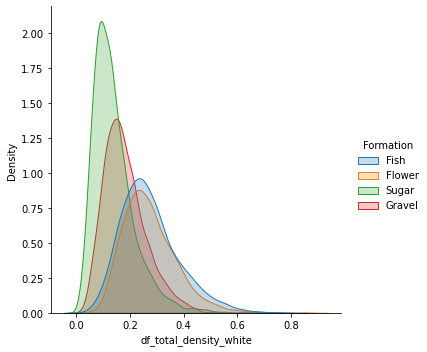

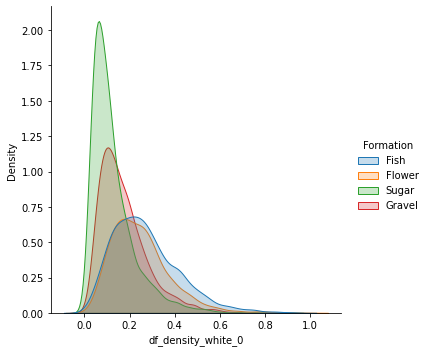

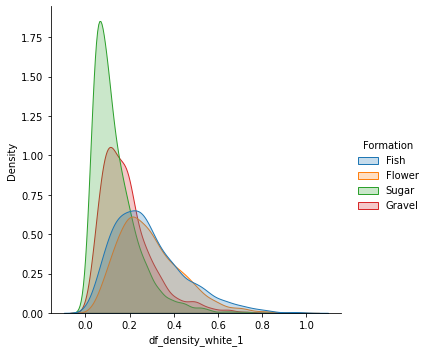

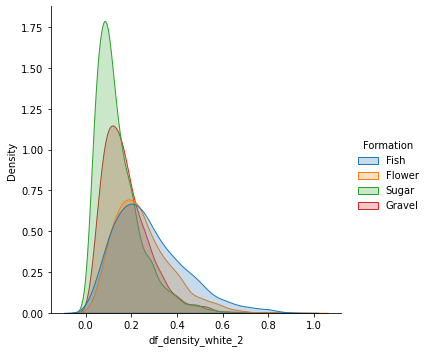

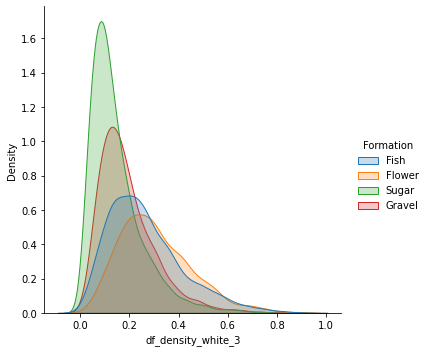

In [ ]:
sns.displot(df, x="df_total_density_white", hue="Formation", kind="kde", fill=True);
plt.figure()
plt.subplot(1,4,1)
sns.displot(df, x="df_density_white_0", hue="Formation", kind="kde", fill=True);
plt.subplot(1,4,2)
sns.displot(df, x="df_density_white_1", hue="Formation", kind="kde", fill=True);
plt.subplot(1,4,3)
sns.displot(df, x="df_density_white_2", hue="Formation", kind="kde", fill=True);
plt.subplot(1,4,4)
sns.displot(df, x="df_density_white_3", hue="Formation", kind="kde", fill=True);

globalement le sugar et gravel sont un peu moins denses en blanc que fish et flower

####mise en forme du dataframe et préparation des data pour pouvoir créer un modele de machine learning

In [ ]:
#mise en forme du dataframe (mise en forme et separation variable cible, suppression colonnes inutiles) 

In [ ]:

data['Formation'].replace({'Fish':1,'Flower':2,'Sugar':3,'Gravel':4},inplace=True) #remplacement des noms de formation par des chiffres
data.head()

,Image,Formation,EncodedPixels,df_ratio_bbox,df_surface_bb,df_total_density_white,df_density_white_0,df_density_white_1,df_density_white_2,df_density_white_3
0,0011165.jpg,1,264918 937 266318 937 267718 937 269118 937 27...,0.941650,930384,0.162704,0.164027,0.150007,0.132096,0.204685
1,0011165.jpg,2,1355565 1002 1356965 1002 1358365 1002 1359765...,0.934281,1184552,0.368665,0.286360,0.419281,0.316038,0.452981
2,002be4f.jpg,1,233813 878 235213 878 236613 878 238010 881 23...,0.458572,1688720,0.284133,0.280524,0.401360,0.166265,0.288442
3,002be4f.jpg,2,1339279 519 1340679 519 1342079 519 1343479 51...,0.453988,591038,0.288861,0.198368,0.273637,0.280390,0.402615
4,002be4f.jpg,3,67495 350 68895 350 70295 350 71695 350 73095 ...,0.389509,312704,0.015347,0.019820,0.005452,0.019397,0.016202


In [ ]:
#definition variable cible

In [ ]:
target=data['Formation'] 

In [ ]:
target.head()

0    1
1    2
2    1
3    2
4    3
Name: Formation, dtype: int64

In [ ]:
data=data.drop(['Image','EncodedPixels','Formation'],axis=1) #definition features
data.head()

,df_ratio_bbox,df_surface_bb,df_total_density_white,df_density_white_0,df_density_white_1,df_density_white_2,df_density_white_3
0,0.941650,930384,0.162704,0.164027,0.150007,0.132096,0.204685
1,0.934281,1184552,0.368665,0.286360,0.419281,0.316038,0.452981
2,0.458572,1688720,0.284133,0.280524,0.401360,0.166265,0.288442
3,0.453988,591038,0.288861,0.198368,0.273637,0.280390,0.402615
4,0.389509,312704,0.015347,0.019820,0.005452,0.019397,0.016202


In [ ]:
#separation train et test sets

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(data,target,test_size=0.2)

In [ ]:
#standardisation

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler=StandardScaler().fit(X_train)

X_train_scaled=scaler.transform(X_train)
X_test_scaled=scaler.transform(X_test)


#### SVM , optimisation avec un gridsearch et évaluation des performances

In [ ]:
#svm et optimisation avec gridsearchcv + performances

In [ ]:
from sklearn import svm

clf=svm.SVC(gamma=0.01,kernel='poly')
clf.fit(X_train_scaled,y_train) 

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.01, kernel='poly',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [ ]:
#definition Gridsearch
from sklearn.model_selection import GridSearchCV

parametres = {'C':[0.1,1,10], 'kernel':['rbf','linear', 'poly'], 'gamma':[0.001, 0.1, 0.5]}

grid_clf = GridSearchCV(estimator=clf, param_grid=parametres)

grille = grid_clf.fit(X_train_scaled,y_train) #entrainement

print(grid_clf.best_params_) #affichage meilleurs parametres

{'C': 1, 'gamma': 0.1, 'kernel': 'rbf'}


In [ ]:
y_pred = grid_clf.predict(X_test_scaled)
pd.crosstab(y_test, y_pred, rownames=['Classe réelle'], colnames=['Classe prédite']) #affichage matrice de confusion

Classe prédite,1,2,3,4
Classe réelle,,,,
1,300,99,59,81
2,132,204,56,100
3,78,29,581,106
4,83,70,258,132


les classes 1 et 3 (Fish et Sugar) sont mieux reconnues. Pour la classe 4 (gravel), le modèle se trompe souvent en la classant en 3. Cela confirme notre intuition du début.

In [ ]:
grid_clf.best_score_

0.5022192583022763

In [ ]:
#calcul de l'accuracy

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_pred,y_test)

0.5139358108108109

Le score d'accuracy concernant la reconnaissance des classes à partir des bouding boxes est de 0.51